# NN
## domain 2

In [195]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_classification
import json
import numpy as np
import pandas as pd

In [345]:
text = []
label = []
model = []
with open("../../data/domain2_train.json") as f:
    for line in f:
        # read line by line
        data = json.loads(line)
        
        # add values
        text.append(data["text"])
        label.append(data["label"])

In [346]:
len(text)

14900

In [373]:
data1 = []
data2 = []
test = []
# Assuming the NDJSON data is stored in a file called 'data.ndjson'

# Assuming the NDJSON data is stored in a file called 'data.ndjson'
with open("../../data/domain2_train.json", 'r') as file:
    for line in file:
        dict = json.loads(line.strip())
        dict["domain"] = 2
        data2.append(dict)

with open("../../data/domain1_train.json", 'r') as file:
    for line in file:
        dict = json.loads(line.strip())
        dict["domain"] = 1
        data1.append(dict)


data_string1 = [' '.join(map(str, sample['text'])) for sample in data1]
data_string2 = [' '.join(map(str, sample['text'])) for sample in data2]
df2 = pd.DataFrame(data2)
df1 = pd.DataFrame(data1)

y2 = df2['label']


In [480]:
test = []
# Assuming the NDJSON data is stored in a file called 'data.ndjson'

# Assuming the NDJSON data is stored in a file called 'data.ndjson'
with open("../../data/test_set.json", 'r') as file:
    for line in file:
        dict = json.loads(line.strip())
        dict["domain"] = 0
        test.append(dict)
test_df = pd.DataFrame(test)

In [376]:
df2['model']= df2.model.fillna(7)
model = list(df2['model'])

In [377]:
df2.model.describe()

count    14900.000000
mean         3.140470
std          2.415426
min          0.000000
25%          1.000000
50%          3.000000
75%          6.000000
max          7.000000
Name: model, dtype: float64

In [396]:
df3.groupby('label').count()

,text,domain,model
label,,,
0,22500,22500,22500
1,2150,2150,2150


text      0
label     0
domain    0
model     0
dtype: int64
              label        domain         model
count  24650.000000  24650.000000  24650.000000
mean       0.482759      1.604462      4.667059
std        0.499713      0.488976      2.662348
min        0.000000      1.000000      0.000000
25%        0.000000      1.000000      2.000000
50%        0.000000      2.000000      6.000000
75%        1.000000      2.000000      7.000000
max        1.000000      2.000000      7.000000


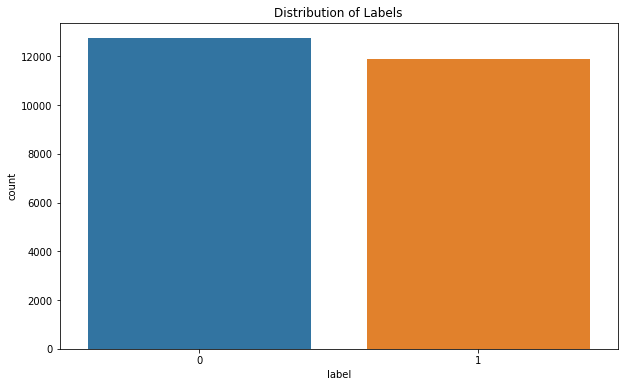

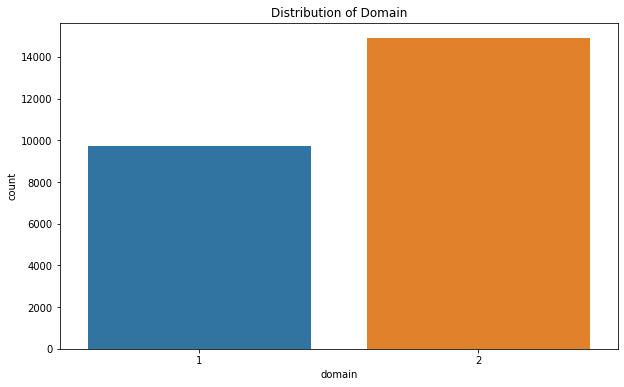

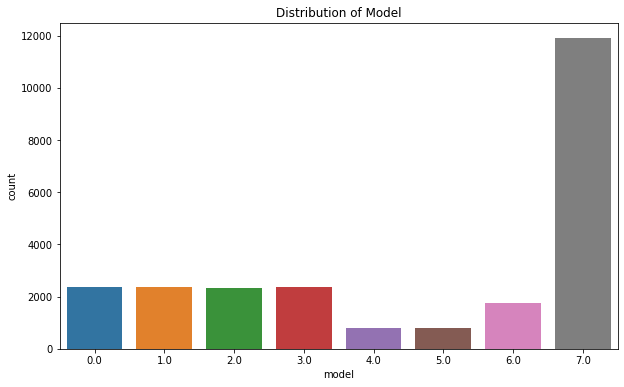

In [400]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming you have the dataset loaded as a DataFrame named 'df'
df = df3
print(df.isnull().sum())

# Descriptive statistics
print(df.describe())

# Distribution of 'label' column
plt.figure(figsize=(10, 6))
sns.countplot(data=df, x='label')
plt.title('Distribution of Labels')
plt.show()

# Distribution of 'domain' column
plt.figure(figsize=(10, 6))
sns.countplot(data=df, x='domain')
plt.title('Distribution of Domain')
plt.show()

# Distribution of 'model' column
plt.figure(figsize=(10, 6))
sns.countplot(data=df, x='model')
plt.title('Distribution of Model')
plt.show()




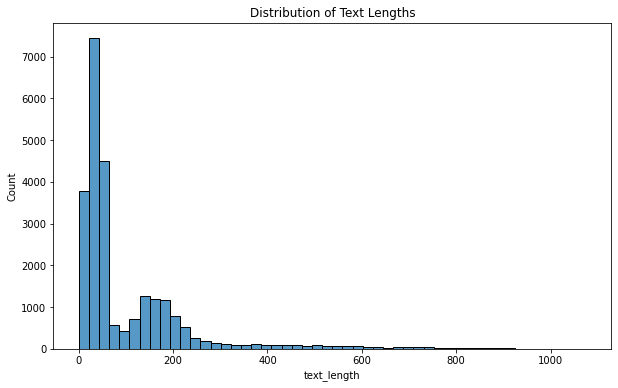

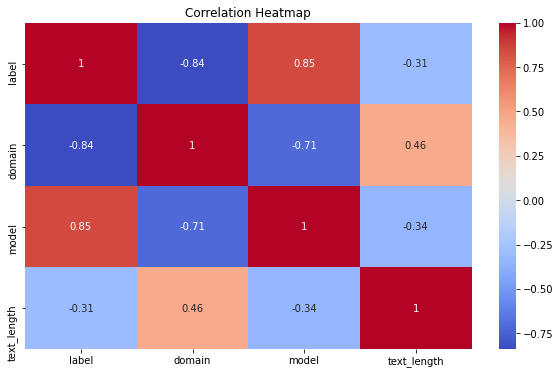

In [401]:
# Text length analysis without eval
df['text_length'] = df['text'].apply(len)

plt.figure(figsize=(10, 6))
sns.histplot(df['text_length'], bins=50)
plt.title('Distribution of Text Lengths')
plt.show()



# Check for correlation between features
corr_matrix = df[['label', 'domain', 'model', 'text_length']].corr()
plt.figure(figsize=(10, 6))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()

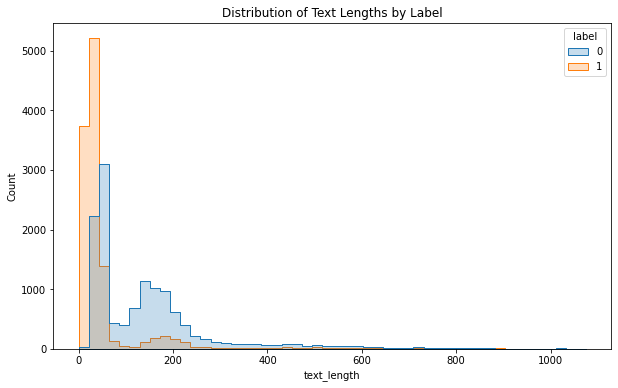

In [402]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Sample data creation
# df = pd.DataFrame({
#     'text': ['hello', 'hello world', 'this is a longer sentence', 'short', 'medium length sentence'],
#     'label': [1, 0, 1, 0, 1]
# })

# Assuming you have a dataframe `df` with columns `text` and `label`
df2['text_length'] = df2['text'].apply(len)

plt.figure(figsize=(10, 6))
sns.histplot(data=df, x='text_length', hue='label', element='step', stat='count', common_norm=False, bins=50)
plt.title('Distribution of Text Lengths by Label')
plt.show()

Counter({5: 16684, 8: 15817, 7: 14234, 6: 13351, 9: 11385, 11: 9069, 10: 8190, 14: 7098, 13: 7093, 15: 6739, 12: 6306, 16: 5545, 17: 5007, 18: 4854, 21: 4324, 20: 4169, 19: 3942, 23: 3814, 27: 3480, 24: 3390, 22: 3207, 25: 3059, 26: 3051, 29: 3019, 37: 2840, 34: 2771, 32: 2765, 36: 2745, 39: 2634, 35: 2539, 30: 2538, 38: 2428, 31: 2394, 28: 2323, 42: 2283, 76: 2106, 43: 2093, 40: 2064, 41: 2029, 33: 1960, 45: 1943, 46: 1891, 50: 1884, 44: 1801, 54: 1752, 52: 1730, 49: 1622, 53: 1567, 58: 1558, 51: 1546, 57: 1541, 59: 1500, 56: 1492, 61: 1416, 65: 1400, 66: 1304, 67: 1299, 64: 1292, 60: 1269, 69: 1255, 68: 1240, 72: 1240, 75: 1238, 71: 1227, 74: 1216, 47: 1163, 77: 1137, 70: 1135, 55: 1133, 79: 1121, 85: 1111, 78: 1064, 88: 1063, 86: 1061, 81: 1041, 80: 989, 84: 971, 83: 924, 94: 906, 90: 893, 73: 884, 97: 865, 91: 857, 87: 837, 106: 837, 102: 830, 100: 826, 99: 822, 101: 817, 98: 809, 114: 791, 117: 791, 123: 779, 121: 773, 111: 771, 89: 768, 116: 765, 82: 755, 105: 750, 108: 748, 110:

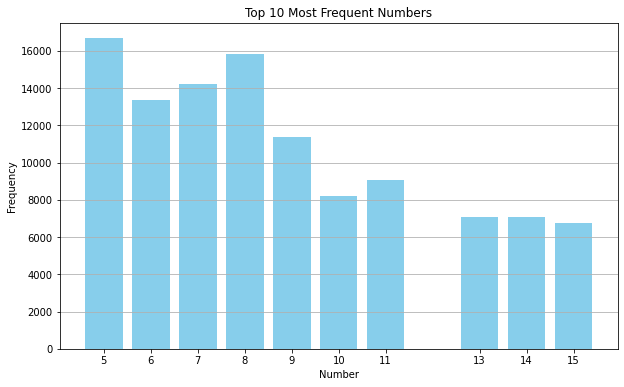

In [403]:
from collections import Counter

# Nested list

# Flatten the list
flattened_data = [item for sublist in text for item in sublist]

# Get the frequency of each number
number_frequency = Counter(flattened_data)

print(number_frequency)
top_10 = number_frequency.most_common(10)

# Separate the numbers and their counts for plotting
numbers, counts = zip(*top_10)

# Create the plot
plt.figure(figsize=(10, 6))
plt.bar(numbers, counts, color='skyblue')
plt.xlabel('Number')
plt.ylabel('Frequency')
plt.title('Top 10 Most Frequent Numbers')
plt.xticks(numbers)
plt.grid(axis='y')

plt.show()



In [348]:
df2

,text,label,domain,model,text_length
0,"[3147, 471, 4, 343, 2, 0, 1, 14, 124, 133, 436...",1,2,7.0,41
1,"[10, 389, 232, 24, 2, 0, 4730, 1, 13, 10, 129,...",1,2,7.0,45
2,"[861, 0, 2505, 2, 0, 1015, 2, 0, 3, 1772, 8, 3...",1,2,7.0,633
3,"[325, 21, 3234, 1, 14, 187, 16, 13, 1965, 1, 1...",1,2,7.0,40
4,"[5, 1091, 272, 6, 3232, 32, 2, 1012, 4, 3240, ...",1,2,7.0,133
...,...,...,...,...,...
14895,"[175, 1317, 38, 754, 9, 5, 0, 228, 1, 45, 6, 2...",0,2,1.0,109
14896,"[466, 5, 70, 1242, 6, 3888, 1, 34, 43, 5, 70, ...",0,2,3.0,35
14897,"[10, 0, 21, 1650, 18, 5, 1335, 1, 208, 5, 997,...",0,2,1.0,56
14898,"[18, 39, 316, 133, 365, 2019, 1, 27, 10, 5, 61...",0,2,4.0,51


In [349]:
words = [word for sublist in text for word in sublist]

# Get the frequency of each word
word_frequency = Counter(words)

# Identify the top 5 most frequent words
top_5_words = [word[0] for word in word_frequency.most_common(5)]

# Remove the top 5 words from the list of lists
filtered_text = [[word for word in sublist if word not in top_5_words] for sublist in text]

print(c)

[[3147, 471, 343, 14, 124, 133, 4367, 7, 598, 16, 14, 119, 5, 615, 6, 1834, 286, 30, 138, 13, 10, 5, 906, 14, 239, 286, 631, 335, 2691], [10, 389, 232, 24, 4730, 13, 10, 129, 75, 36, 7, 45, 89, 167, 51, 455, 981, 197, 54, 89, 167, 981, 243, 13, 13, 52, 7, 414, 4730, 94], [861, 2505, 1015, 1772, 8, 37, 813, 3745, 21, 1058, 6, 4703, 4281, 2114, 1263, 7, 720, 2098, 85, 55, 45, 564, 17, 13, 95, 2199, 14, 8, 15, 5, 499, 50, 401, 2848, 745, 17, 5, 2510, 745, 6, 198, 2245, 179, 251, 19, 22, 18, 1307, 419, 250, 421, 19, 2098, 7, 861, 22, 5, 2030, 7, 102, 833, 12, 14, 150, 31, 166, 419, 701, 861, 18, 6, 8, 166, 419, 701, 8, 13, 8, 15, 40, 2468, 16, 49, 798, 21, 659, 2052, 1659, 595, 16, 70, 344, 4552, 7, 2030, 5, 2247, 2735, 2350, 2214, 1766, 54, 9, 1612, 518, 6, 5, 308, 98, 7, 598, 330, 193, 805, 72, 21, 188, 625, 65, 103, 421, 19, 4050, 72, 595, 16, 962, 1131, 521, 14, 10, 33, 70, 344, 4552, 130, 14, 598, 35, 1712, 605, 14, 2558, 5, 1659, 9, 2848, 7, 72, 9, 1318, 1055, 3010, 6, 160, 401, 33, 

In [350]:
df2['filtered_text'] = filtered_text

In [354]:
df2

,text,label,domain,model,text_length,filtered_text
0,"[3147, 471, 4, 343, 2, 0, 1, 14, 124, 133, 436...",1,2,7.0,41,"[3147, 471, 343, 14, 124, 133, 4367, 7, 598, 1..."
1,"[10, 389, 232, 24, 2, 0, 4730, 1, 13, 10, 129,...",1,2,7.0,45,"[10, 389, 232, 24, 4730, 13, 10, 129, 75, 36, ..."
2,"[861, 0, 2505, 2, 0, 1015, 2, 0, 3, 1772, 8, 3...",1,2,7.0,633,"[861, 2505, 1015, 1772, 8, 37, 813, 3745, 21, ..."
3,"[325, 21, 3234, 1, 14, 187, 16, 13, 1965, 1, 1...",1,2,7.0,40,"[325, 21, 3234, 14, 187, 16, 13, 1965, 14, 162..."
4,"[5, 1091, 272, 6, 3232, 32, 2, 1012, 4, 3240, ...",1,2,7.0,133,"[5, 1091, 272, 6, 3232, 32, 1012, 3240, 19, 29..."
...,...,...,...,...,...,...
14895,"[175, 1317, 38, 754, 9, 5, 0, 228, 1, 45, 6, 2...",0,2,1.0,109,"[175, 1317, 38, 754, 9, 5, 228, 45, 6, 175, 17..."
14896,"[466, 5, 70, 1242, 6, 3888, 1, 34, 43, 5, 70, ...",0,2,3.0,35,"[466, 5, 70, 1242, 6, 3888, 34, 43, 5, 70, 657..."
14897,"[10, 0, 21, 1650, 18, 5, 1335, 1, 208, 5, 997,...",0,2,1.0,56,"[10, 21, 1650, 18, 5, 1335, 208, 5, 997, 3334,..."
14898,"[18, 39, 316, 133, 365, 2019, 1, 27, 10, 5, 61...",0,2,4.0,51,"[18, 39, 316, 133, 365, 2019, 27, 10, 5, 615, ..."


In [378]:
df = df2
from sklearn.utils import resample

# Define the target sample size per model
target_sample_size = 2150 // 7

resampled_dfs = []

for model_num in df['model'].unique():
    subset = df[df['model'] == model_num]
    
    if model_num != 7.0:
        if len(subset) < target_sample_size:
            # Upsample if there are fewer samples than target
            subset_resampled = resample(subset, replace=True, n_samples=target_sample_size, random_state=42)
        else:
            # Downsample if there are more samples than target
            subset_resampled = subset.sample(n=target_sample_size, random_state=42)
    else:
        # Keep model 7.0 as it is
        subset_resampled = subset.sample(n=target_sample_size * 7, random_state=42)
    
    resampled_dfs.append(subset_resampled)

# Concatenate all the resampled subsets
df_resampled = pd.concat(resampled_dfs)

# Checking the count for each model
print(df_resampled.groupby('model').size())


model
0.0     307
1.0     307
2.0     307
3.0     307
4.0     307
5.0     307
6.0     307
7.0    2149
dtype: int64


In [379]:
print(df2.groupby('model').size())


model
0.0    2364
1.0    2357
2.0    2339
3.0    2358
4.0     789
5.0     780
6.0    1763
7.0    2150
dtype: int64


In [382]:
len(df2)
14900 - 2150

12750

In [383]:
df2

,text,label,domain,model
0,"[3147, 471, 4, 343, 2, 0, 1, 14, 124, 133, 436...",1,2,7.0
1,"[10, 389, 232, 24, 2, 0, 4730, 1, 13, 10, 129,...",1,2,7.0
2,"[861, 0, 2505, 2, 0, 1015, 2, 0, 3, 1772, 8, 3...",1,2,7.0
3,"[325, 21, 3234, 1, 14, 187, 16, 13, 1965, 1, 1...",1,2,7.0
4,"[5, 1091, 272, 6, 3232, 32, 2, 1012, 4, 3240, ...",1,2,7.0
...,...,...,...,...
14895,"[175, 1317, 38, 754, 9, 5, 0, 228, 1, 45, 6, 2...",0,2,1.0
14896,"[466, 5, 70, 1242, 6, 3888, 1, 34, 43, 5, 70, ...",0,2,3.0
14897,"[10, 0, 21, 1650, 18, 5, 1335, 1, 208, 5, 997,...",0,2,1.0
14898,"[18, 39, 316, 133, 365, 2019, 1, 27, 10, 5, 61...",0,2,4.0


In [397]:
df1_sub = df1[df1['label']== 1]
df1_sub['model'] = 7.0
df1_sub

<ipython-input-397-869746cb61a8>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1_sub['model'] = 7.0


,text,label,domain,model
0,"[70, 746, 825, 109, 2083, 0, 2, 0, 0, 0, 9, 0,...",1,1,7.0
1,"[1209, 179, 1952, 4, 4959, 7, 0, 2, 978, 1522,...",1,1,7.0
2,"[287, 3, 3330, 0, 23, 12, 13, 465, 74, 8, 0, 8...",1,1,7.0
3,"[0, 0, 3, 592, 19, 2, 706, 1439, 2575, 7, 2, 0...",1,1,7.0
4,"[9, 2, 110, 12, 42, 32, 44, 361, 9, 3860, 2358...",1,1,7.0
...,...,...,...,...
9745,"[30, 64, 1923, 54, 0, 0, 12, 4018, 254, 6, 164...",1,1,7.0
9746,"[2, 4519, 6, 2, 117, 3, 7, 1676, 156, 0, 6, 2,...",1,1,7.0
9747,"[543, 0, 5, 2707, 16, 0, 6, 0, 66, 20, 447, 3,...",1,1,7.0
9748,"[22, 929, 4, 0, 22, 2, 0, 2134, 10, 3, 4038, 0...",1,1,7.0


In [399]:
import pandas as pd

df3 = pd.concat([df1_sub, df2], ignore_index=True)


In [380]:
print(df1.groupby('label').size())


label
0    9750
1    9750
dtype: int64


In [356]:
df_resampled

,text,label,domain,model,text_length,filtered_text
1159,"[53, 139, 2097, 18, 433, 6, 21, 0, 1, 14, 41, ...",1,2,7.0,713,"[53, 139, 2097, 18, 433, 6, 21, 14, 41, 44, 64..."
1823,"[423, 5, 0, 2912, 234, 511, 0, 1, 11, 187, 24,...",1,2,7.0,214,"[423, 5, 2912, 234, 511, 11, 187, 24, 2627, 27..."
978,"[0, 0, 2194, 254, 1893, 22, 0, 0, 0, 51, 0, 54...",1,2,7.0,567,"[2194, 254, 1893, 22, 51, 543, 1311, 9, 1744, ..."
759,"[2, 324, 822, 17, 2206, 2, 2079, 6, 0, 53, 107...",1,2,7.0,574,"[324, 822, 17, 2206, 2079, 6, 53, 107, 15, 142..."
874,"[10, 18, 2, 1178, 1, 14, 133, 4, 2, 1540, 1, 8...",1,2,7.0,29,"[10, 18, 1178, 14, 133, 1540, 872, 14, 10, 221..."
...,...,...,...,...,...,...
8112,"[0, 0, 1, 2, 0, 10, 1794, 3, 22, 2, 2157, 3782...",0,2,2.0,187,"[10, 1794, 22, 2157, 3782, 214, 2549, 1460, 16..."
13614,"[26, 3644, 225, 1, 14, 284, 4706, 2388, 29, 34...",0,2,2.0,40,"[26, 3644, 225, 14, 284, 4706, 2388, 29, 34, 6..."
8542,"[756, 4, 31, 40, 2840, 1, 14, 1677, 754, 4, 21...",0,2,2.0,36,"[756, 31, 40, 2840, 14, 1677, 754, 21, 241, 61..."
8100,"[10, 0, 36, 591, 1, 27, 123, 5, 573, 4, 36, 14...",0,2,2.0,37,"[10, 36, 591, 27, 123, 5, 573, 36, 1478, 1223,..."


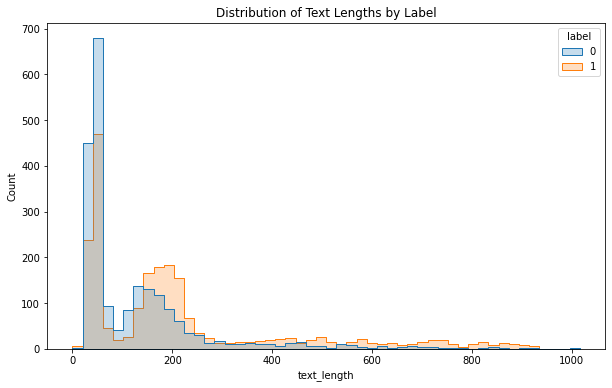

In [357]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Sample data creation
# df = pd.DataFrame({
#     'text': ['hello', 'hello world', 'this is a longer sentence', 'short', 'medium length sentence'],
#     'label': [1, 0, 1, 0, 1]
# })

# Assuming you have a dataframe `df` with columns `text` and `label`
df_resampled['text_length'] = df_resampled['text'].apply(len)

plt.figure(figsize=(10, 6))
sns.histplot(data=df_resampled, x='text_length', hue='label', element='step', stat='count', common_norm=False, bins=50)
plt.title('Distribution of Text Lengths by Label')
plt.show()

In [404]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Sample data creation
# df = pd.DataFrame({
#     'text': ['hello', 'hello world', 'this is a longer sentence', 'short', 'medium length sentence'],
#     'label': [1, 0, 1, 0, 1]
# })

# Assuming you have a dataframe `df` with columns `text` and `label`
df_resampled['text_length'] = df_resampled['filtered_text'].apply(len)

plt.figure(figsize=(10, 6))
sns.histplot(data=df_resampled, x='text_length', hue='label', element='step', stat='count', common_norm=False, bins=50)
plt.title('Distribution of Text Lengths by Label')
plt.show()

KeyError: 'filtered_text'

In [493]:
df_resampled = df3
model = list(df_resampled['model'])
vector_sample = np.arange(5000)
from sklearn.feature_extraction.text import CountVectorizer

def toStr(n):
   return str(n)

# Create a Vectorizer Object
vectorizer = CountVectorizer(preprocessor= toStr, analyzer="word", token_pattern=r"(?u)\b\w+\b")

vectorizer.fit(vector_sample)

# Encode the Document
text = list(df_resampled['text'])
vector = vectorizer.transform(text)


In [494]:

X = vector.toarray()
y = np.array(model).ravel()

print("Shape of X:", X.shape)
print("Shape of y:", y.shape)

Shape of X: (24650, 5000)
Shape of y: (24650,)


In [495]:
import pandas as pd

# Assuming X is your feature matrix
df_features = pd.DataFrame(X)
variances = df_features.var(axis=0)
print(variances.sort_values())


1648      0.000000
1481      0.000000
2308      0.000000
628       0.000000
3608      0.000000
           ...    
4734     27.741678
2223     61.707757
1112     70.399702
1       144.895329
0       241.731177
Length: 5000, dtype: float64


In [496]:
from sklearn.feature_selection import SelectKBest, f_classif

# Choose k (e.g., 2000) and adjust as necessary
selector = SelectKBest(f_classif, k=2000)
X_new = selector.fit_transform(X, y)

/Users/graceliu/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:110: UserWarning: Features [ 118  383  628  758  834  914  925 1010 1307 1481 1482 1618 1648 2071
 2099 2246 2308 2660 2695 2790 2813 3413 3488 3532 3592 3608 3739 4063
 4072 4248 4262 4684 4753] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/Users/graceliu/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


In [501]:
final_selector = selector

array([[32, 14,  3, ...,  0,  0,  0],
       [ 2, 11,  0, ...,  0,  0,  0],
       [ 0,  0,  0, ...,  0,  0,  0],
       ...,
       [ 0,  0,  0, ...,  0,  0,  0],
       [ 7,  1,  0, ...,  0,  0,  0],
       [27, 18,  6, ...,  0,  0,  0]])

In [410]:
print("Shape of X new:", X_new.shape)
print("Shape of y:", y.shape)

Shape of X new: (24650, 2000)
Shape of y: (24650,)


In [411]:
from sklearn.decomposition import PCA

pca = PCA(n_components=1000)  # Choose the number of components
X_pca = pca.fit_transform(X)


In [226]:
print("Shape of X_pca:", X_pca.shape)
print("Shape of y:", y.shape)

Shape of X_pca: (4298, 1000)
Shape of y: (4298,)


In [264]:
import numpy as np
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer

# Sample data
df = pd.DataFrame(np.random.randint(0,200,size=(4298, 200)), columns=list(range(200)))

# Convert each row to a space-separated string
df['text'] = df.apply(lambda row: ' '.join(row.astype(str)), axis=1)

# Create a Vectorizer Object
vectorizer = CountVectorizer(analyzer="word", token_pattern=r"(?u)\b\w+\b")

# Only fit and transform on the 'text' column
X = vectorizer.fit_transform(df['text'])

y = df_resampled['model']
# The result 'X' is a sparse matrix representation of the bag-of-words encoding


In [413]:
print("Shape of X:", X.shape)
print("Shape of y:", y.shape)

Shape of X: (24650, 5000)
Shape of y: (24650,)


## Data splitting

In [414]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_new, y, test_size=0.2, random_state=42)


## Building NN

In [415]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from sklearn.model_selection import KFold
import matplotlib.pyplot as plt

In [416]:

# Define the Neural Network
class TextClassifier(nn.Module):
    def __init__(self, input_size, hidden_size, num_classes):
        super(TextClassifier, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_size)
        self.relu = nn.ReLU()
        self.fc2 = nn.Linear(hidden_size, hidden_size)
        self.dropout = nn.Dropout(0.5)
        self.fc3 = nn.Linear(hidden_size, num_classes)
    
    def forward(self, x):
        out = self.fc1(x)
        out = self.relu(out)
        out = self.fc2(out)
        out = self.dropout(out)
        out = self.fc3(out)
        return out

# Assuming your data is loaded into X_train, y_train, X_test, y_test
X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train, dtype=torch.long)
X_test_tensor = torch.tensor(X_test, dtype=torch.float32)
y_test_tensor = torch.tensor(y_test, dtype=torch.long)

# Hyperparameters
input_size = 2000
hidden_size = 100
num_classes = 8
num_epochs = 200
batch_size = 1000
learning_rate = 0.001

# Create an instance of the classifier and define loss and optimizer
model = TextClassifier(input_size, hidden_size, num_classes)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=learning_rate)

# Train the model
for epoch in range(num_epochs):
    for i in range(0, X_train.shape[0], batch_size): 
        X_batch = X_train_tensor[i:i+batch_size]
        y_batch = y_train_tensor[i:i+batch_size]
        
        # Forward pass
        outputs = model(X_batch)
        loss = criterion(outputs, y_batch)
        
        # Backward pass and optimize
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        print(f'Epoch [{epoch+1}/{num_epochs}], Step [{i+1}/{X_train.shape[0]//batch_size}], Loss: {loss.item():.4f}')


# Evaluate the model and get predicted classes
with torch.no_grad():
    outputs = model(X_test_tensor)
    _, predicted = torch.max(outputs.data, 1)

# Convert the predicted classes as per the mentioned conditions
converted_predictions = (predicted == 7).int()

# Convert true labels similarly
converted_true_labels = (y_test_tensor == 7).int()

# Compute accuracy for the converted predictions
accuracy_converted = (converted_predictions == converted_true_labels).sum().item() / len(converted_true_labels)
print(f'Converted Accuracy of the model on test data: {accuracy_converted * 100:.2f}%')

Epoch [1/200], Step [1/19], Loss: 2.0889
Epoch [1/200], Step [1001/19], Loss: 2.0567
Epoch [1/200], Step [2001/19], Loss: 2.0234
Epoch [1/200], Step [3001/19], Loss: 2.0039
Epoch [1/200], Step [4001/19], Loss: 1.9703
Epoch [1/200], Step [5001/19], Loss: 1.9631
Epoch [1/200], Step [6001/19], Loss: 1.9608
Epoch [1/200], Step [7001/19], Loss: 1.9328
Epoch [1/200], Step [8001/19], Loss: 1.9042
Epoch [1/200], Step [9001/19], Loss: 1.9147
Epoch [1/200], Step [10001/19], Loss: 1.8891
Epoch [1/200], Step [11001/19], Loss: 1.8504
Epoch [1/200], Step [12001/19], Loss: 1.8561
Epoch [1/200], Step [13001/19], Loss: 1.8310
Epoch [1/200], Step [14001/19], Loss: 1.8419
Epoch [1/200], Step [15001/19], Loss: 1.8275
Epoch [1/200], Step [16001/19], Loss: 1.8116
Epoch [1/200], Step [17001/19], Loss: 1.7608
Epoch [1/200], Step [18001/19], Loss: 1.7796
Epoch [1/200], Step [19001/19], Loss: 1.7517
Epoch [2/200], Step [1/19], Loss: 1.7012
Epoch [2/200], Step [1001/19], Loss: 1.6872
Epoch [2/200], Step [2001/19

# !!!

In [519]:
model

TextClassifier(
  (fc1): Linear(in_features=2000, out_features=100, bias=True)
  (relu): ReLU()
  (fc2): Linear(in_features=100, out_features=100, bias=True)
  (dropout): Dropout(p=0.5, inplace=False)
  (fc3): Linear(in_features=100, out_features=8, bias=True)
)

In [511]:

# Sample test data (adjust to read from your actual data source)
test_data = []
# Assuming the NDJSON data is stored in a file called 'data.ndjson'

# Assuming the NDJSON data is stored in a file called 'data.ndjson'
with open("../../data/test_set.json", 'r') as file:
    for line in file:
        dict = json.loads(line.strip())
        test_data.append(dict)

# Extract test texts and IDs
test_texts = [item["text"] for item in test_data]
test_ids = [item["id"] for item in test_data]


In [520]:
test_texts

[[59,
  2,
  3434,
  1013,
  823,
  2,
  887,
  6,
  2375,
  0,
  34,
  43,
  584,
  18,
  0,
  0,
  6,
  686,
  1,
  56,
  43,
  2881,
  1107,
  0,
  287,
  1495,
  9,
  2,
  1013,
  71,
  447,
  2,
  3519,
  0,
  118,
  13,
  10,
  532,
  81,
  1,
  13,
  8,
  15,
  329,
  10,
  0,
  1,
  0,
  1,
  0,
  1,
  5,
  4083,
  1372,
  2938,
  3,
  7,
  13,
  41,
  0,
  120,
  156,
  4752,
  1013,
  1,
  30,
  4083,
  11,
  269,
  661,
  114,
  4,
  2,
  3217,
  6,
  713,
  1,
  944,
  57,
  4,
  0,
  551,
  1,
  39,
  329,
  17,
  0,
  1565,
  0,
  1,
  11,
  240,
  5,
  802,
  6,
  2,
  0,
  1683,
  0,
  6,
  0,
  7,
  6,
  2,
  0,
  6,
  0,
  3,
  74,
  0,
  422,
  22,
  2,
  0,
  0,
  1,
  11,
  10,
  186,
  497,
  842,
  3490,
  144,
  33,
  2,
  0,
  6,
  451,
  3,
  202,
  73,
  11,
  55,
  774,
  608,
  1,
  11,
  32,
  1122,
  22,
  2,
  4083,
  3,
  0,
  3,
  2671,
  4744,
  136,
  120,
  1013,
  3,
  270,
  4,
  945,
  157,
  2620,
  1,
  59,
  2,
  0,
  3782,
  2671,
  0,
  0,
 

In [535]:
test_texts

[[59,
  2,
  3434,
  1013,
  823,
  2,
  887,
  6,
  2375,
  0,
  34,
  43,
  584,
  18,
  0,
  0,
  6,
  686,
  1,
  56,
  43,
  2881,
  1107,
  0,
  287,
  1495,
  9,
  2,
  1013,
  71,
  447,
  2,
  3519,
  0,
  118,
  13,
  10,
  532,
  81,
  1,
  13,
  8,
  15,
  329,
  10,
  0,
  1,
  0,
  1,
  0,
  1,
  5,
  4083,
  1372,
  2938,
  3,
  7,
  13,
  41,
  0,
  120,
  156,
  4752,
  1013,
  1,
  30,
  4083,
  11,
  269,
  661,
  114,
  4,
  2,
  3217,
  6,
  713,
  1,
  944,
  57,
  4,
  0,
  551,
  1,
  39,
  329,
  17,
  0,
  1565,
  0,
  1,
  11,
  240,
  5,
  802,
  6,
  2,
  0,
  1683,
  0,
  6,
  0,
  7,
  6,
  2,
  0,
  6,
  0,
  3,
  74,
  0,
  422,
  22,
  2,
  0,
  0,
  1,
  11,
  10,
  186,
  497,
  842,
  3490,
  144,
  33,
  2,
  0,
  6,
  451,
  3,
  202,
  73,
  11,
  55,
  774,
  608,
  1,
  11,
  32,
  1122,
  22,
  2,
  4083,
  3,
  0,
  3,
  2671,
  4744,
  136,
  120,
  1013,
  3,
  270,
  4,
  945,
  157,
  2620,
  1,
  59,
  2,
  0,
  3782,
  2671,
  0,
  0,
 

In [536]:
X_test = vectorizer.transform(test_df['text']).toarray()
X_new_test = selector.transform(X_test)
X_test_selected = final_selector.transform(X_test)
X_test_selected
print("Shape of X:", X_test_selected.shape)

Shape of X: (1000, 2000)


In [537]:
X_test_selected

array([[32, 14,  3, ...,  0,  0,  0],
       [ 2, 11,  0, ...,  0,  0,  0],
       [ 0,  0,  0, ...,  0,  0,  0],
       ...,
       [ 0,  0,  0, ...,  0,  0,  0],
       [ 7,  1,  0, ...,  0,  0,  0],
       [27, 18,  6, ...,  0,  0,  0]])

In [538]:
X_test_tensor = torch.tensor(X_test_selected, dtype=torch.float32)


In [539]:
X_test_tensor.size()

torch.Size([1000, 2000])

In [542]:
import torch

# Assuming you have the NumPy array X_test_selected
X_test_selected_tensor = torch.tensor(X_test_selected, dtype=torch.float32)

# Predict using the model
with torch.no_grad():
    outputs = model(X_test_selected_tensor)
    _, predicted = torch.max(outputs.data, 1)


In [544]:
predicted_binary = (predicted == 7).long()


In [545]:
lst = predicted_binary.tolist()

In [546]:
print(lst.count(0))
print(lst.count(1))

692
308


In [547]:

# Create a DataFrame for the desired output
output_df = pd.DataFrame({
    "id": test_ids,
    "class": lst
})

# Save the DataFrame to a CSV file for Kaggle submission
output_df.to_csv("submission.csv", index=False)


In [417]:
count_7 = torch.sum(predicted == 7).item()
count_7


2284

In [418]:
count_ = torch.sum(predicted != 7).item()
count_


2646

In [284]:
predicted.numel()

860

In [295]:
converted_tensor = (predicted == 7).int()

# Convert tensor to list
result_list = converted_tensor.tolist()

print(result_list)
len(result_list)

[1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 

860

In [293]:

# Convert the dataframe column to a list
true_labels = list(df_resampled['label'])

# Ensure that both lists are of the same length
if len(result_list) != len(true_labels):
    raise ValueError("Both lists must have the same length for accuracy calculation.")

# Count the number of matching elements between the two lists
matches = sum([1 for a, b in zip(result_list, true_labels) if a == b])

# Calculate accuracy
accuracy = matches / len(result_list)

print(f"Accuracy: {accuracy * 100:.2f}%")


ValueError: Both lists must have the same length for accuracy calculation.

### K-fold validation

In [ ]:

# Define the Neural Network
class TextClassifier(nn.Module):
    def __init__(self, input_size, hidden_size, num_classes):
        super(TextClassifier, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_size)
        self.relu = nn.ReLU()
        self.fc2 = nn.Linear(hidden_size, hidden_size)
        self.dropout = nn.Dropout(0.5)
        self.fc3 = nn.Linear(hidden_size, num_classes)
    
    def forward(self, x):
        out = self.fc1(x)
        out = self.relu(out)
        out = self.fc2(out)
        out = self.dropout(out)
        out = self.fc3(out)
        return out

Epoch [1/10], Step [1/119], Loss: 0.7240
Epoch [1/10], Step [101/119], Loss: 0.5781
Epoch [1/10], Step [201/119], Loss: 0.4704
Epoch [1/10], Step [301/119], Loss: 0.3934
Epoch [1/10], Step [401/119], Loss: 0.2852
Epoch [1/10], Step [501/119], Loss: 0.2266
Epoch [1/10], Step [601/119], Loss: 0.1682
Epoch [1/10], Step [701/119], Loss: 0.1174
Epoch [1/10], Step [801/119], Loss: 0.0954
Epoch [1/10], Step [901/119], Loss: 0.0745
Epoch [1/10], Step [1001/119], Loss: 0.0565
Epoch [1/10], Step [1101/119], Loss: 0.0273
Epoch [1/10], Step [1201/119], Loss: 0.0195
Epoch [1/10], Step [1301/119], Loss: 0.0130
Epoch [1/10], Step [1401/119], Loss: 0.0137
Epoch [1/10], Step [1501/119], Loss: 0.0081
Epoch [1/10], Step [1601/119], Loss: 0.0081
Epoch [1/10], Step [1701/119], Loss: 0.0056
Epoch [1/10], Step [1801/119], Loss: 0.0040
Epoch [1/10], Step [1901/119], Loss: 0.0027
Epoch [1/10], Step [2001/119], Loss: 0.0024
Epoch [1/10], Step [2101/119], Loss: 0.0023
Epoch [1/10], Step [2201/119], Loss: 0.0014


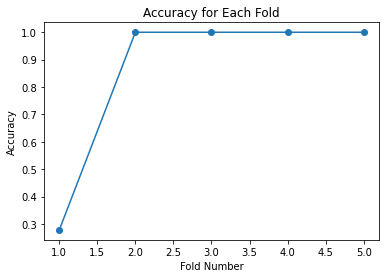

In [ ]:
# Assuming your data is loaded into X_train, y_train, X_test, y_test
# Convert data to PyTorch tensors
X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train, dtype=torch.long)
X_test_tensor = torch.tensor(X_test, dtype=torch.float32)
y_test_tensor = torch.tensor(y_test, dtype=torch.long)


# Hyperparameters
input_size = 5000
hidden_size = 100
num_classes = 2
num_epochs = 10
batch_size = 100
learning_rate = 0.001

# Define KFold Cross-validation
n_splits = 5
kf = KFold(n_splits=n_splits)
accuracies = []

for train_idx, val_idx in kf.split(X):
    X_train, X_val = X[train_idx], X[val_idx]
    y_train, y_val = y[train_idx], y[val_idx]
    
    # Convert to PyTorch tensors
    X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
    y_train_tensor = torch.tensor(y_train, dtype=torch.long)
    X_val_tensor = torch.tensor(X_val, dtype=torch.float32)
    y_val_tensor = torch.tensor(y_val, dtype=torch.long)
    
    # Create an instance of the classifier and define loss and optimizer
    model = TextClassifier(input_size, hidden_size, num_classes)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)

    # Train the model
    for epoch in range(num_epochs):
        for i in range(0, len(X_train), batch_size):
            X_batch = X_train_tensor[i:i+batch_size]
            y_batch = y_train_tensor[i:i+batch_size]

            outputs = model(X_batch)
            loss = criterion(outputs, y_batch)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            print(f'Epoch [{epoch+1}/{num_epochs}], Step [{i+1}/{len(X_train)//batch_size}], Loss: {loss.item():.4f}')

    # Evaluate the model
    with torch.no_grad():
        outputs = model(X_val_tensor)
        _, predicted = torch.max(outputs.data, 1)
        accuracy = (predicted == y_val_tensor).sum().item() / len(y_val_tensor)
        accuracies.append(accuracy)


# Plotting the accuracies
plt.plot(range(1, n_splits + 1), accuracies, marker='o')
plt.xlabel('Fold Number')
plt.ylabel('Accuracy')
plt.title('Accuracy for Each Fold')
plt.show()


In [ ]:
accuracies

[0.2785234899328859, 1.0, 1.0, 1.0, 1.0]

In [ ]:
save_path = "model_4th_fold_domain2.pth"

for fold, (train_idx, val_idx) in enumerate(kf.split(X)):
    
    # Split the data
    X_train, X_val = X[train_idx], X[val_idx]
    y_train, y_val = y[train_idx], y[val_idx]
    
    # Convert to PyTorch tensors
    X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
    y_train_tensor = torch.tensor(y_train, dtype=torch.long)
    X_val_tensor = torch.tensor(X_val, dtype=torch.float32)
    y_val_tensor = torch.tensor(y_val, dtype=torch.long)
    
    # Create an instance of the classifier and define loss and optimizer
    model = TextClassifier(input_size, hidden_size, num_classes)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)

    # Train the model
    for epoch in range(num_epochs):
        for i in range(0, len(X_train), batch_size):
            X_batch = X_train_tensor[i:i+batch_size]
            y_batch = y_train_tensor[i:i+batch_size]

            outputs = model(X_batch)
            loss = criterion(outputs, y_batch)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            print(f'Epoch [{epoch+1}/{num_epochs}], Step [{i+1}/{len(X_train)//batch_size}], Loss: {loss.item():.4f}')

    # Evaluate the model
    with torch.no_grad():
        outputs = model(X_val_tensor)
        _, predicted = torch.max(outputs.data, 1)
        accuracy = (predicted == y_val_tensor).sum().item() / len(y_val_tensor)
        accuracies.append(accuracy)

    # Save the model after training on the 4th fold
    if fold == 3:  # 0-indexed, so 3 means 4th fold
        torch.save(model.state_dict(), save_path)

# Continue with plotting the accuracies or any other tasks you want to perform after training on all folds.


Epoch [1/10], Step [1/119], Loss: 0.6633
Epoch [1/10], Step [101/119], Loss: 0.5168
Epoch [1/10], Step [201/119], Loss: 0.4063
Epoch [1/10], Step [301/119], Loss: 0.3432
Epoch [1/10], Step [401/119], Loss: 0.2535
Epoch [1/10], Step [501/119], Loss: 0.2021
Epoch [1/10], Step [601/119], Loss: 0.1388
Epoch [1/10], Step [701/119], Loss: 0.1007
Epoch [1/10], Step [801/119], Loss: 0.0810
Epoch [1/10], Step [901/119], Loss: 0.0638
Epoch [1/10], Step [1001/119], Loss: 0.0511
Epoch [1/10], Step [1101/119], Loss: 0.0272
Epoch [1/10], Step [1201/119], Loss: 0.0169
Epoch [1/10], Step [1301/119], Loss: 0.0099
Epoch [1/10], Step [1401/119], Loss: 0.0141
Epoch [1/10], Step [1501/119], Loss: 0.0066
Epoch [1/10], Step [1601/119], Loss: 0.0086
Epoch [1/10], Step [1701/119], Loss: 0.0048
Epoch [1/10], Step [1801/119], Loss: 0.0030
Epoch [1/10], Step [1901/119], Loss: 0.0029
Epoch [1/10], Step [2001/119], Loss: 0.0020
Epoch [1/10], Step [2101/119], Loss: 0.0032
Epoch [1/10], Step [2201/119], Loss: 0.0012


### Predict domian2

In [ ]:
# Instantiate the model
loaded_model = TextClassifier(input_size, hidden_size, num_classes)

# Load the saved weights
loaded_model.load_state_dict(torch.load(save_path))

# Set the model to evaluation mode
loaded_model.eval()

# Make predictions
with torch.no_grad():
    test_tensor = torch.tensor(X_test, dtype=torch.float32)  # Assuming you've got your test data in X_test
    outputs = loaded_model(test_tensor)
    _, predicted = torch.max(outputs.data, 1)
    # Now `predicted` contains the predicted labels for the test set


In [ ]:
text = []
label = []

with open("../../data/test_set.json") as f:
    for line in f:
        # read line by line
        data = json.loads(line)
        
        # add values
        text.append(data["text"])
        #label.append(data["label"])
vector_sample = np.arange(5000)

def toStr(n):
   return str(n)

# Create a Vectorizer Object
vectorizer = CountVectorizer(preprocessor= toStr, analyzer="word", token_pattern=r"(?u)\b\w+\b")

vectorizer.fit(vector_sample)

# Printing the identified Unique words along with their indices
print("Vocabulary: ", vectorizer.vocabulary_)

# Encode the Document
vector = vectorizer.transform(text)

# Summarizing the Encoded Texts
print("Encoded Document is:")
print(vector.toarray())

X_predict = vector.toarray()
y_predict = np.array(label).ravel()

print("Shape of X:", X_predict.shape)
print("Shape of y:", y_predict.shape)

Vocabulary:  {'0': 0, '1': 1, '2': 1112, '3': 2223, '4': 3334, '5': 4445, '6': 4556, '7': 4667, '8': 4778, '9': 4889, '10': 2, '11': 113, '12': 224, '13': 335, '14': 446, '15': 557, '16': 668, '17': 779, '18': 890, '19': 1001, '20': 1113, '21': 1224, '22': 1335, '23': 1446, '24': 1557, '25': 1668, '26': 1779, '27': 1890, '28': 2001, '29': 2112, '30': 2224, '31': 2335, '32': 2446, '33': 2557, '34': 2668, '35': 2779, '36': 2890, '37': 3001, '38': 3112, '39': 3223, '40': 3335, '41': 3446, '42': 3557, '43': 3668, '44': 3779, '45': 3890, '46': 4001, '47': 4112, '48': 4223, '49': 4334, '50': 4446, '51': 4457, '52': 4468, '53': 4479, '54': 4490, '55': 4501, '56': 4512, '57': 4523, '58': 4534, '59': 4545, '60': 4557, '61': 4568, '62': 4579, '63': 4590, '64': 4601, '65': 4612, '66': 4623, '67': 4634, '68': 4645, '69': 4656, '70': 4668, '71': 4679, '72': 4690, '73': 4701, '74': 4712, '75': 4723, '76': 4734, '77': 4745, '78': 4756, '79': 4767, '80': 4779, '81': 4790, '82': 4801, '83': 4812, '84':

In [ ]:
X_predict

array([[32, 14,  3, ...,  0,  0,  0],
       [ 2, 11,  0, ...,  0,  0,  0],
       [ 0,  0,  0, ...,  0,  0,  0],
       ...,
       [ 0,  0,  0, ...,  0,  0,  0],
       [ 7,  1,  0, ...,  0,  0,  0],
       [27, 18,  6, ...,  0,  0,  0]])

In [ ]:
# Instantiate the model
loaded_model = TextClassifier(input_size, hidden_size, num_classes)

# Load the saved weights
loaded_model.load_state_dict(torch.load(save_path))

# Set the model to evaluation mode
loaded_model.eval()

# Make predictions
with torch.no_grad():
    test_tensor = torch.tensor(X_predict, dtype=torch.float32)  # Assuming you've got your test data in X_test
    outputs = loaded_model(test_tensor)
    _, predicted = torch.max(outputs.data, 1)
    # Now `predicted` contains the predicted labels for the test set


In [ ]:
import csv

# Your tensor
tensor_data = predicted  # Fill in with your tensor data

# Convert tensor to list
data_list = tensor_data.tolist()

# Write to CSV
with open('result_NN_domain2.csv', 'w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(["id", "class"])
    for idx, value in enumerate(data_list):
        writer.writerow([idx, value])


### Feedback:
1. domain 2 is imbalanced and need more preprocessing (sampling etc.)

## Optimisation
### Strategy


1. **Resampling:** Consider using techniques like oversampling the minority class, undersampling the majority class, or using Synthetic Minority Over-sampling Technique (SMOTE) to balance the dataset.

2. **Different Metrics:** Evaluate your model using precision, recall, F1-score, or AUC-ROC to get a clearer picture of how it's performing for each class.

3. **Adjust Class Weights:** Many models in PyTorch, like `nn.CrossEntropyLoss`, allow you to set class weights. This can help in penalizing misclassifications of the minority class more than the majority class.

4. **Regularization:** Regularization techniques, like dropout or L2 regularization, can be used to prevent overfitting.

5. **Model Complexity:** Consider using a simpler model or reducing the complexity of your existing model.

6. **Stratified K-Fold:** Instead of standard K-Fold, use Stratified K-Fold which maintains the percentage of samples for each class. This ensures that each fold is a good representative of the overall class distribution.


### 1. Resampling:
Oversampling:

In [ ]:
from sklearn.utils import resample

# Separate majority and minority classes
majority_indices = np.where(y == 0)[0]
minority_indices = np.where(y == 1)[0]

majority = X[majority_indices]
minority = X[minority_indices]

# Upsample minority class
minority_upsampled = resample(minority,
                              replace=True,
                              n_samples=majority.shape[0],
                              random_state=42)

# Combine majority class with upsampled minority class
X_upsampled = np.vstack([majority, minority_upsampled])
y_upsampled = np.hstack([y[majority_indices], [1] * minority_upsampled.shape[0]])


Undersampling:

In [ ]:
# Downsample majority class
majority_downsampled = resample(majority,
                                replace=False,
                                n_samples=minority.shape[0],
                                random_state=42)

# Combine minority class with downsampled majority class
X_downsampled = np.vstack([majority_downsampled, minority])
y_downsampled = np.hstack([y[majority_indices][:minority.shape[0]], y[minority_indices]])


SMOTE

In [ ]:
from imblearn.over_sampling import SMOTE

sm = SMOTE(random_state=42)
X_res, y_res = sm.fit_resample(X, y)

## N gram

### Convert text data to 3-grams:

In [ ]:
def sequence_to_trigrams(sequence):
    # Extract 3-grams from the sequence
    return [sequence[i:i+3] for i in range(len(sequence)-2)]

data["text"] = sequence_to_trigrams(data["text"])

print(data)

{'id': 999, 'text': [[9, 1017, 4], [1017, 4, 1394], [4, 1394, 0], [1394, 0, 61], [0, 61, 365], [61, 365, 2539], [365, 2539, 3], [2539, 3, 0], [3, 0, 7], [0, 7, 89], [7, 89, 1615], [89, 1615, 27], [1615, 27, 71], [27, 71, 91], [71, 91, 365], [91, 365, 76], [365, 76, 27], [76, 27, 10], [27, 10, 125], [10, 125, 4], [125, 4, 200], [4, 200, 0], [200, 0, 7], [0, 7, 36], [7, 36, 188], [36, 188, 1], [188, 1, 11], [1, 11, 119], [11, 119, 2], [119, 2, 294], [2, 294, 4], [294, 4, 631], [4, 631, 36], [631, 36, 97], [36, 97, 4894], [97, 4894, 118], [4894, 118, 0], [118, 0, 36], [0, 36, 1278], [36, 1278, 8], [1278, 8, 37], [8, 37, 125], [37, 125, 4], [125, 4, 4113], [4, 4113, 2], [4113, 2, 566], [2, 566, 19], [566, 19, 36], [19, 36, 273], [36, 273, 135], [273, 135, 2585], [135, 2585, 3], [2585, 3, 27], [3, 27, 23], [27, 23, 1], [23, 1, 1234], [1, 1234, 133], [1234, 133, 114], [133, 114, 533], [114, 533, 0], [533, 0, 7], [0, 7, 3257], [7, 3257, 0], [3257, 0, 1485], [0, 1485, 6], [1485, 6, 4894], [6, 

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer

vectorizer = CountVectorizer(ngram_range=(1,2)) 
X_train = vectorizer.fit_transform(X_train).toarray()
X_test = vectorizer.transform(X_test).toarray()
